In [18]:
# IMPORTING THE LIBRARIES 
import os
# linear algebra
import numpy as np
# data processing, CSV file I/O (e.g. pd.read_csv)
import pandas as pd
# matplotlib
import matplotlib.pyplot as plt
from matplotlib import cm
%matplotlib inline

from mpl_toolkits.mplot3d import Axes3D 
import seaborn as sns

from bokeh.palettes import Magma, Inferno, Plasma, Viridis, Cividis


# Trackml library to help dealing with data
import trackml
from trackml.dataset import load_event, load_dataset
from trackml.randomize import shuffle_hits
from trackml.score import score_event

import ipyvolume as ipv
import ipywidgets as widgets

# for clustering with DBSCAN
from sklearn import metrics
from sklearn.cluster import DBSCAN
from sklearn.preprocessing import MaxAbsScaler
# To help read the files
from os import listdir
from os.path import isfile, join

from IPython.display import clear_output
from IPython.core.display import display, HTML

#import plotly.plotly as py
import plotly.graph_objs as go
from plotly.offline import download_plotlyjs, init_notebook_mode, plot, iplot
init_notebook_mode(connected=True)

In [2]:
display(HTML("<style>.container { width:100% !important;}</style>"))

event1 = ['event000001000', 'event000001004']
eventFilePath = 'train_sample/train_100_events'

# Ekstract all filenames in train_100_events document
event = [f.split('-')[0] for f in listdir(eventFilePath) if isfile(join(eventFilePath, f))]

# Load_event function from trackml library to load hits, cells, particles, truth  
for idx, e in enumerate(event1):
    hits, cells, particles, truth = load_event(os.path.join('train_sample/train_100_events', e))
    
#for idx, event in enumerate(event_prefix):
#    hits, cells, particles, truth = load_event(os.path.join('train_sample/train_100_events', event))

#mem_bytes = (hits.memory_usage(index=True).sum() 
#             + cells.memory_usage(index=True).sum() 
#             + particles.memory_usage(index=True).sum() 
#             + truth.memory_usage(index=True).sum())
#print('Memory usage {:.2f} MB'.format(mem_bytes / 2**20))

The data is already curated but just in case let's get throgh some steps to clean our data 🧹
1. Checking for null values. Visualizing on a heatmap for better view


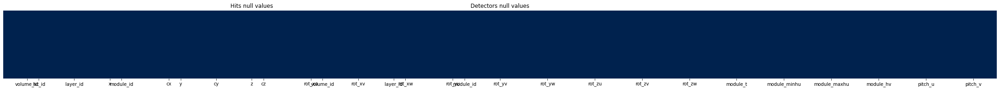

As one can see, there are no null values
2. Checking for 'object' data types, if there is any. 
Object data types sum in Detectors: 0
Object data types sum in Hits: 0
As we see there isn't any. If there was any I would use the .unique() function to detect and then try to change the data types within.
3. Checking for N/A values 
N/a values in Detectors: 0
N/a values in Hits: 0
4. The same for duplicated values 
Duplicated values in Detectors: 0
Duplicated values in Hits: 0
5. Checking for outliers 
count    18728.000000
mean         5.398761
std          2.865323
min          2.000000
25%          4.000000
50%          4.000000
75%          8.000000
max         14.000000
Name: layer_id, dtype: float64
count    138568.000000
mean          5.902272
std           3.401814
min           2.000000
25%           4.000000
50%           6.000000
75%           8.000000
max          14.000000
Name: layer_id, dtype: float64
count    138568.000000
mean         22.398973
std        1063.884888
min   

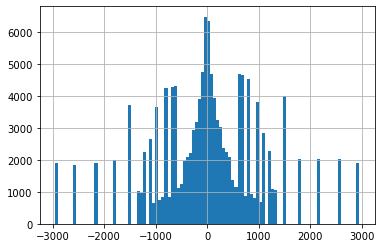

In [3]:
# Let's see the detector in more details
# The detector is built from silicon slabs in cylinders and disks, which detect and measure the position/hits of the particles. 
# volume_id: numerical identifier of the detector group.
# layer_id: numerical identifier of the detector layer inside the group.
# module_id: numerical identifier of the detector module inside the layer.
# ycx, cy, cz: position of the local origin in the described in the global coordinate system (in millimeter).

# Read the detectors file
df = pd.read_csv('detectors.csv')

print("The data is already curated but just in case let's get throgh some steps to clean our data 🧹")
print("1. Checking for null values. Visualizing on a heatmap for better view")
fig = plt.figure(figsize = (30,3)) # Yes some columns mix, but I left it like this to read the col names better (width 30 would be better 80 but the col names would be unreadable)

ax1 = fig.add_subplot(111) 
ax2 = fig.add_subplot(121)
# ax3 = fig.add_subplot(131)
# ax4 = fig.add_subplot(141)
# ax5 = fig.add_subplot(151)

sns.heatmap(df.isnull(), yticklabels = False, cbar = False, cmap = 'cividis', ax=ax1)
ax1.set_title("Detectors null values")
sns.heatmap(hits.isnull(), yticklabels = False, cbar = False, cmap = 'cividis', ax=ax2)
ax2.set_title("Hits null values")
# sns.heatmap(cells.isnull(), yticklabels = False, cbar = False, cmap = 'cividis', ax=ax3)
# sns.heatmap(particles.isnull(), yticklabels = False, cbar = False, cmap = 'cividis', ax=ax4)
# sns.heatmap(truth.isnull(), yticklabels = False, cbar = False, cmap = 'cividis', ax=ax5)
plt.tight_layout(pad=0., w_pad=0., h_pad=0.)
plt.show()
print("As one can see, there are no null values")

print("2. Checking for 'object' data types, if there is any. ")

print('Object data types sum in Detectors: %d' % (df.dtypes == 'object').sum())
print('Object data types sum in Hits: %d' % (hits.dtypes == 'object').sum())

print("As we see there isn't any. If there was any I would use the .unique() function to detect and then try to change the data types within.")

print("3. Checking for N/A values ")

print('N/a values in Detectors: %d' % (df.isna().any().sum()))
print('N/a values in Hits: %d' % (hits.isna().any().sum()))

print("4. The same for duplicated values ")

print('Duplicated values in Detectors: %d' % (df.duplicated().any().sum()))
print('Duplicated values in Hits: %d' % (hits.duplicated().any().sum()))



print("5. Checking for outliers ")
print(df.layer_id.describe())
print(hits.layer_id.describe())
print(hits.z.describe())

hits.z.hist(bins=100)

print("I had doubts for the z col but from this point there are no visible outliers")


In [4]:
# The columns needed
df[['volume_id', 'layer_id', 'module_id','module_t', 'cx', 'cy', 'cz']].head()

,volume_id,layer_id,module_id,module_t,cx,cy,cz
0,7,2,1,0.15,-65.7965,-5.17830,-1502.5
1,7,2,2,0.15,-139.8510,-6.46568,-1502.0
2,7,2,3,0.15,-138.6570,-19.34190,-1498.0
3,7,2,4,0.15,-64.1764,-15.40740,-1498.0
4,7,2,5,0.15,-136.2810,-32.05310,-1502.0


In [5]:

print('Finding out the max and min of xyz so we can decide the limit in the graph')
xmin, xmax = df['cx'].min(), df['cx'].max()
ymin, ymax = df['cy'].min(), df['cy'].max()
zmin, zmax = df['cz'].min(), df['cz'].max()

print('x: %.1f  %.1f' % (xmin, xmax))
print('y: %.1f  %.1f' % (ymin, ymax))
print('z: %.1f  %.1f' % (zmin, zmax))

Finding out the max and min of xyz so we can decide the limit in the graph
x: -1021.3  1021.3
y: -1021.3  1021.3
z: -2955.5  2955.5


In [6]:
 # So we can have the 3 coordinates together
groupby = df.groupby(['volume_id', 'layer_id','module_t']).apply(lambda x: x[['cx', 'cy', 'cz']].values.tolist()).reset_index(name='xyz')
groupby2 = df.groupby(['volume_id']).apply(lambda x: x[['cx', 'cy', 'cz']].values.tolist()).reset_index(name='xyz')

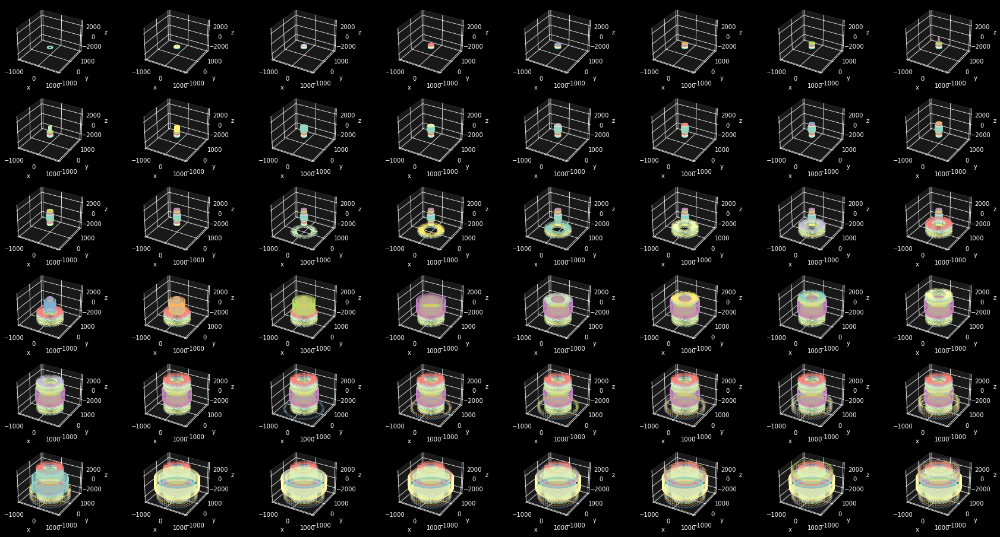

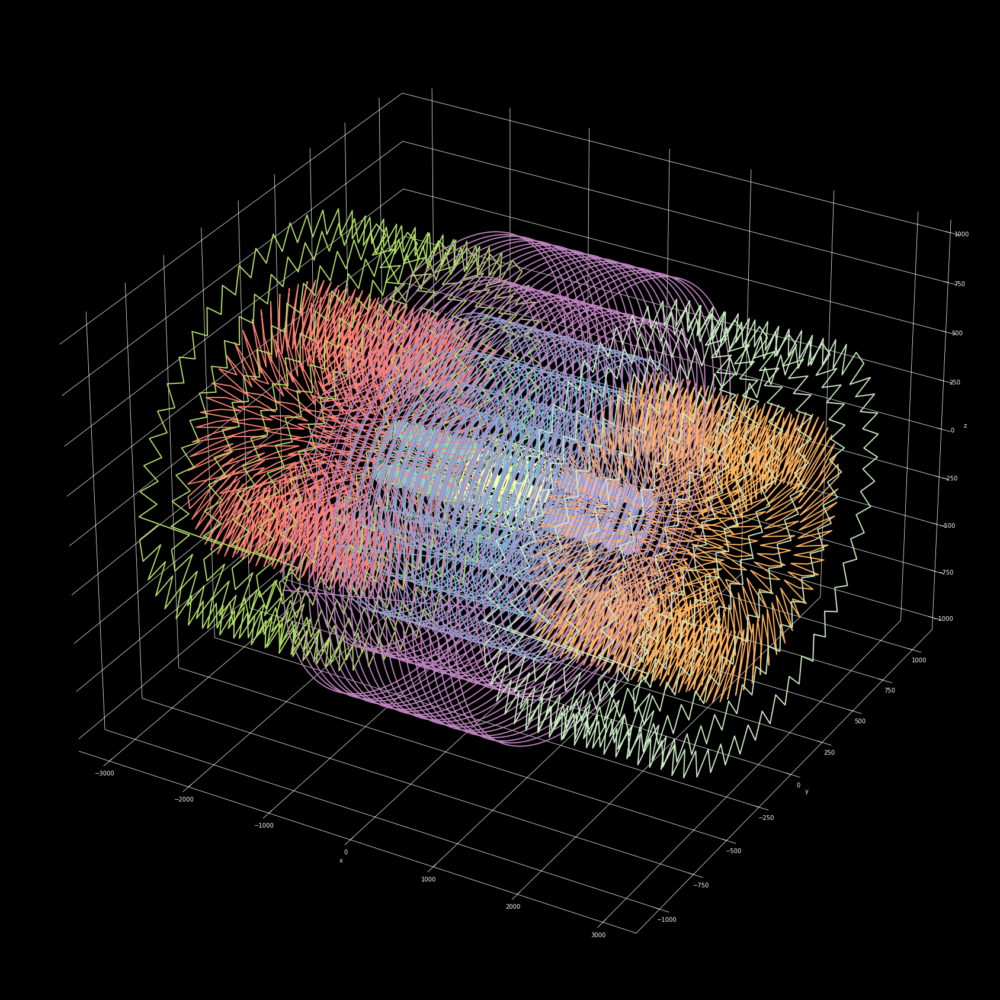

In [27]:
# Plotting the detector "layers" to have a clearer understanding
fig = plt.figure(figsize=(30, 16))
fig2 = plt.figure(figsize=(30, 160))

plt.style.use('dark_background')

for k in range(len(groupby)):
    
    ax = fig.add_subplot(6, 8, k+1, projection='3d')
    # Setting Labels, limits and colors of the graf
    ax.set_aspect('auto');
    ax.set_xlabel('x');
    ax.set_ylabel('y');
    ax.set_zlabel('z');
    ax.set_xlim(xmin, xmax);
    ax.set_ylim(ymin, ymax);                        
    ax.set_zlim(zmin, zmax);                        
    ax.xaxis.set_pane_color((1, 1, 1, 0.1));
    ax.yaxis.set_pane_color((1, 1, 1, 0.1));
    ax.zaxis.set_pane_color((1, 1, 1, 0.1));
    
    
    for (idx, row) in groupby.iloc[:k+1].iterrows():
        xyz = np.array(row['xyz'])
        x, y, z = xyz[:,0], xyz[:,1], xyz[:,2]
        ax.plot(x, y, z, linewidth=0.5)

for k in range(len(groupby2)):
    
    ax2 = fig2.add_subplot(projection='3d')
    # Setting Labels, limits and colors of the graf
    ax2.set_aspect('auto')
    ax2.set_xlabel('x')
    ax2.set_ylabel('y')
    ax2.set_zlabel('z')                   
    ax2.xaxis.set_pane_color((1, 1, 1, 0))
    ax2.yaxis.set_pane_color((1, 1, 1, 0))
    ax2.zaxis.set_pane_color((1, 1, 1, 0))
    
    
    for (idx, row) in groupby2.iloc[:k+1].iterrows():
        xyz = np.array(row['xyz'])
        x, y, z = xyz[:,0], xyz[:,1], xyz[:,2]
        ax2.plot(z, x, y, linewidth=2, visible=True)
        

plt.show()


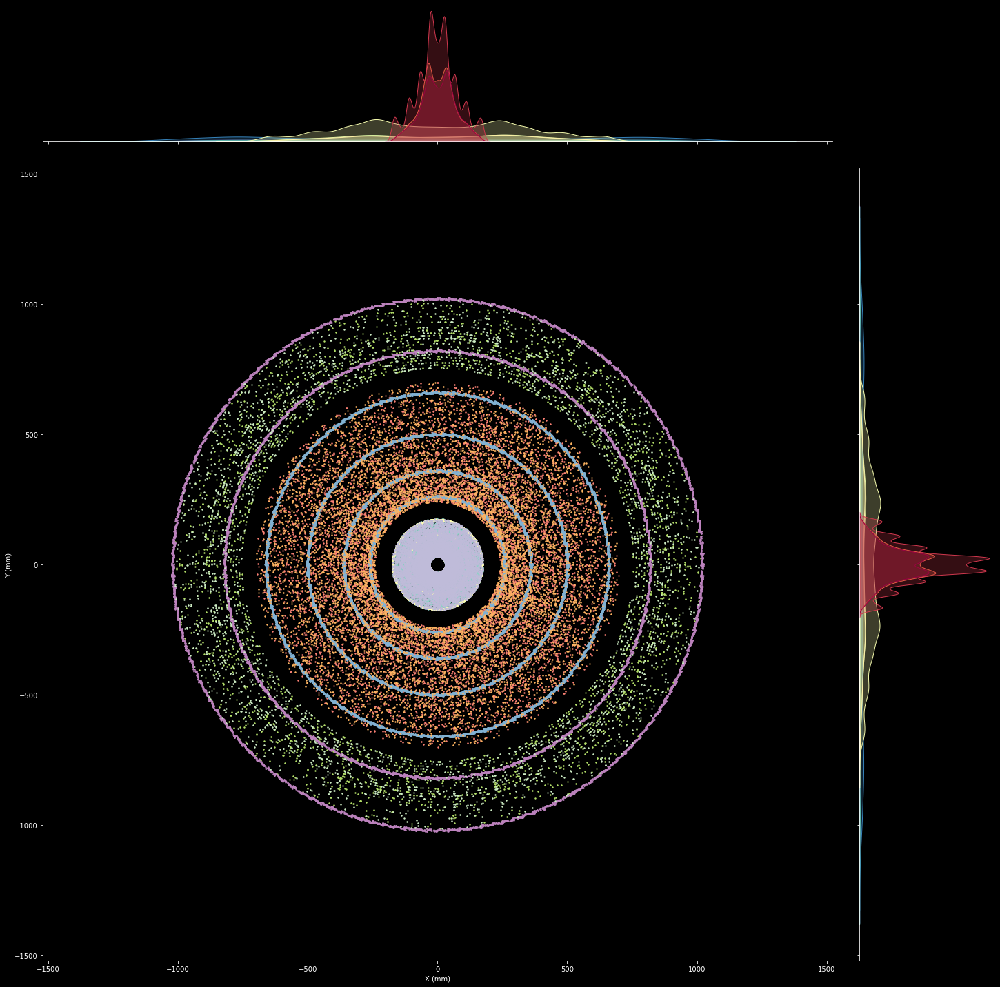

In [15]:
g = sns.jointplot(x='x',y= 'y', data=hits, s=1, height=20, palette='Spectral',hue='volume_id')
g.ax_joint.cla()
plt.sca(g.ax_joint)
 

for vol in groupby2.volume_id:
    v = hits[hits.volume_id == vol]
    x, y= v.x, v.y
    plt.scatter(x, y, s=2)

ax = plt.gca()    
ax.set_xlim(xmin-500, xmax+500);
ax.set_ylim(ymin-500, ymax+500);
plt.xlabel('X (mm)')
plt.ylabel('Y (mm)')

plt.show()


In [9]:
def particleTrajectories(particleHits, ipvLimit): # This function will manage particle trajectories. It used more than once, so let's make it reusable.
    for i in range(0, len(particleHits)):
        # This will generate particle1, particle2...varibles =  particles.loc[particles.nhits].iloc[0,1...]
        exec("particle%d = particleHits.iloc[%d]" % ((i + 1), i));
        exec("p_traj_surface%d = truth[truth.particle_id == particle%d.particle_id][['tx', 'ty', 'tz']]" % ((i + 1), (i+1)));
        exec("p_traj%d = (p_traj_surface%d.append({'tx': particle%d.vx, 'ty': particle%d.vy, 'tz': particle%d.vz}, ignore_index=True).sort_values(by='tz'))" % ((i + 1), (i + 1), (i + 1), (i + 1), (i + 1)));
        
        if (ipvLimit != 'Null' and ipvLimit != 0) : # to show an ipv graf
      
            exec("ipv.scatter( x=p_traj%d.tx, y=p_traj%d.ty, z=p_traj%d.tz, color=colors[%d], marker='sphere')" % ((i + 1), (i + 1), (i + 1), i));  
            ipv.xlim(xmin-ipvLimit, xmax+ipvLimit)
            ipv.ylim(ymin-ipvLimit, ymax+ipvLimit)
            ipv.zlim(zmin-ipvLimit, zmax+ipvLimit)
        else :  # to show a plot graf
            exec("ax3.plot( xs=p_traj%d.tx, ys=p_traj%d.ty, zs=p_traj%d.tz, marker='o')" % ((i + 1), (i + 1), (i + 1)));

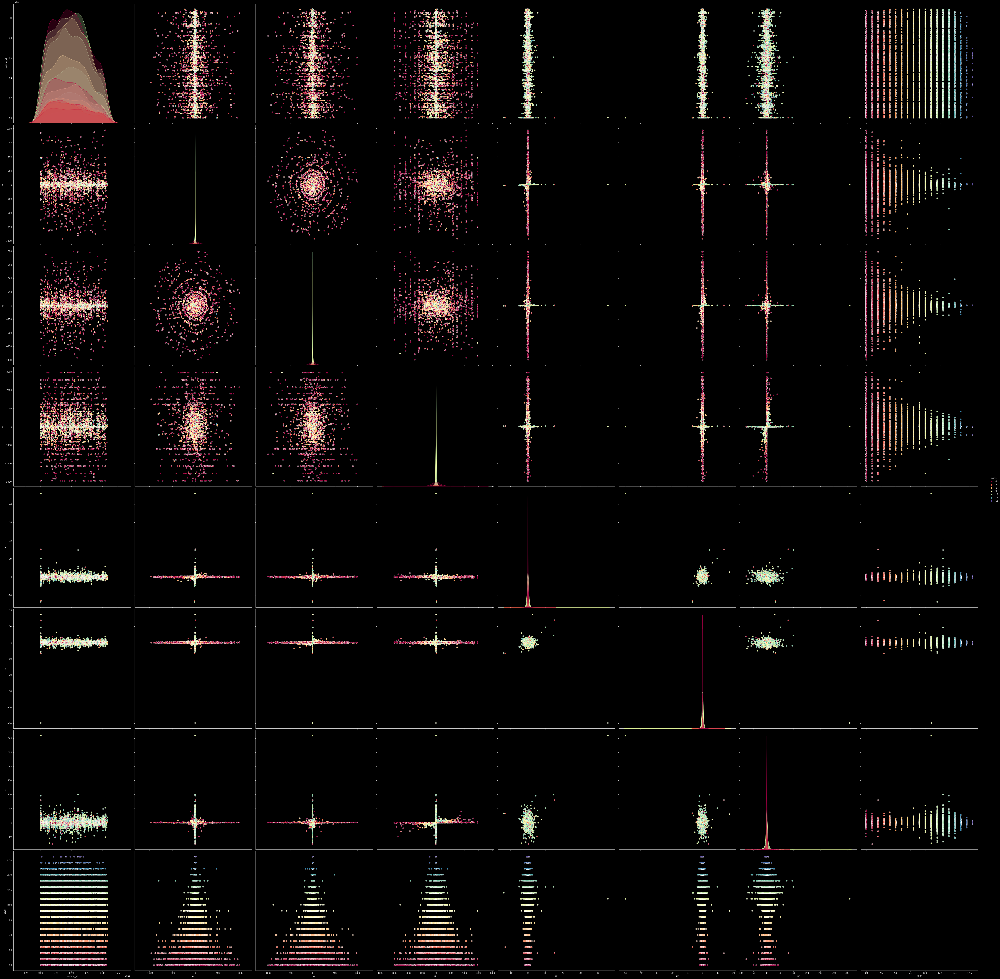

In [16]:
plt.style.use('dark_background')

p_sample = particles #.sample(10)
# Let's now take a look at the relationship between different Pair combinations of the particle variables.
# Again, the colors represent the number of hits.

# There is no large skew in the distribution of the number of hits over other variables.
# It looks like the particles are targetted towards the global origin  (x,y)=(0,0)  and are evenly distributed around it.

sns.pairplot(p_sample, vars=['particle_id', 'vx', 'vy', 'vz', 'px', 'py', 'pz','nhits'],palette='Spectral', hue='nhits', height=8)

plt.show()


In [11]:

# Get particle id with max number of hits in this event

ipv.figure(figsize=(30, 160))
ipv.style.use('dark')
iter = len(particles.loc[particles.nhits == particles.nhits.max()]) +1 
colors= sns.color_palette('Spectral', iter)
colors= colors.as_hex()


particleTrajectories(particles.loc[particles.nhits == particles.nhits.max()], 1000)

ipv.show()

Let's see it all together


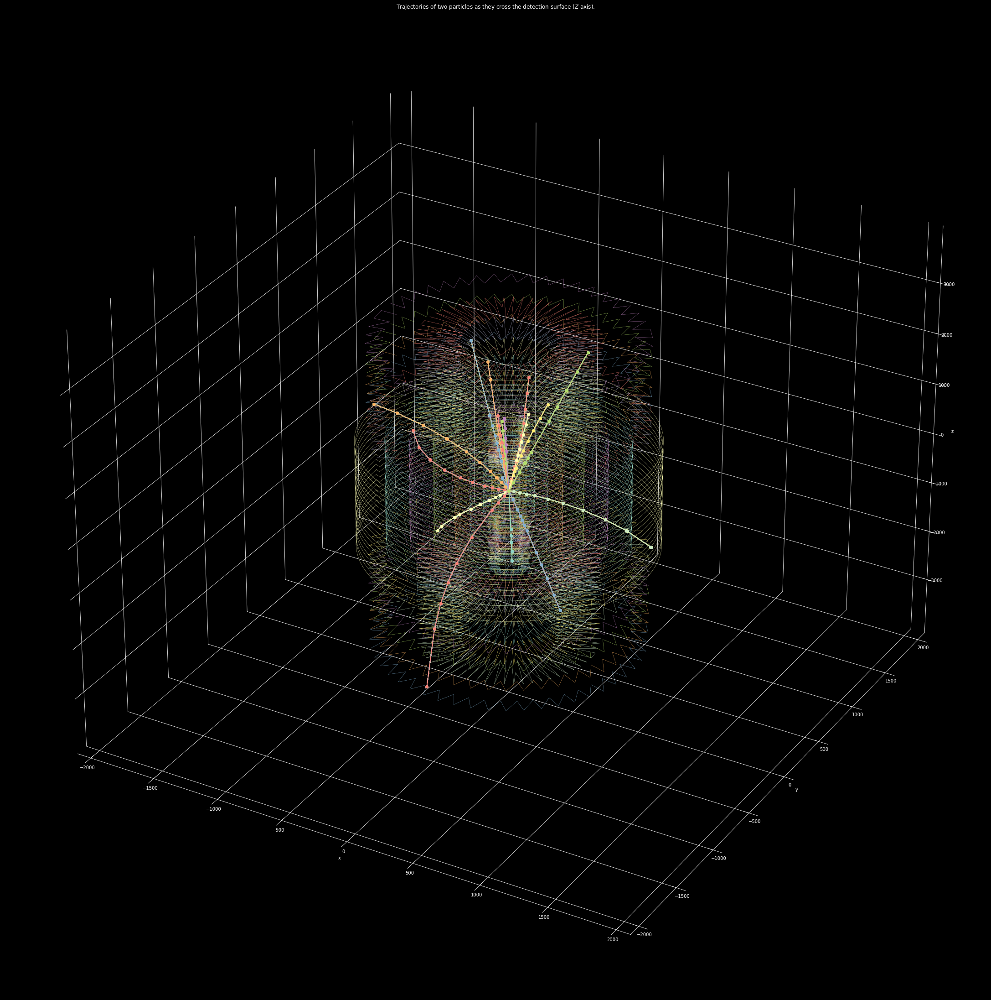

In [12]:
print("Let's see it all together")

fig3 = plt.figure(figsize=(30, 160))

plt.style.use('dark_background')


ax3 = fig3.add_subplot(111, projection='3d')
ax3.set_aspect('auto'); 


for k in range(groupby.shape[0]):
    
    ax3 = fig3.add_subplot(111, projection='3d')
    
    ax3.set_aspect('auto'); 
    ax3.set_xlabel('x'); 
    ax3.set_ylabel('y');    
    ax3.set_zlabel('z');  
    ax3.set_xlim(xmin-1000, xmax+1000);    
    ax3.set_ylim(ymin-1000, ymax+1000);     
    ax3.set_zlim(zmin-1000, zmax+1000);  
    ax3.xaxis.set_pane_color((1, 1, 1, 0))
    ax3.yaxis.set_pane_color((1, 1, 1, 0))
    ax3.zaxis.set_pane_color((1, 1, 1, 0))
     
    for (idx, row) in groupby.iloc[:k+1].iterrows():
        xyz = np.array(row['xyz'])
        x, y, z = xyz[:,0], xyz[:,1], xyz[:,2]
        ax3.plot(x, y, z, linewidth=0.4)
        
particleTrajectories(particles.loc[particles.nhits], 0)


plt.tight_layout(pad=0., w_pad=0., h_pad=0.)
plt.title('Trajectories of two particles as they cross the detection surface ($Z$ axis).')





plt.show()


In [13]:

#for i in range(0, len(particles.loc[particles.nhits == particles.nhits.max()])):
    # This will generate particle1, particle2...varibles =  particles.loc[particles.nhits == particles.nhits.max()].iloc[0,1...]
#    exec("particle%d = particles.loc[particles.nhits == particles.nhits.max()].iloc[%d]" % ((i + 1), i));
#    exec("p_traj_surface%d = truth[truth.particle_id == particle%d.particle_id][['tx', 'ty', 'tz']]" % ((i + 1), (i+1)));
#    exec("p_traj%d = (p_traj_surface%d.append({'tx': particle%d.vx, 'ty': particle%d.vy, 'tz': particle%d.vz}, ignore_index=True).sort_values(by='tz'))" % ((i + 1), (i + 1), (i + 1), (i + 1), (i + 1)));
#    exec("ax.plot( xs=p_traj%d.tx, ys=p_traj%d.ty, zs=p_traj%d.tz, marker='o')" % ((i + 1), (i + 1), (i + 1)));
